<a href="https://colab.research.google.com/github/shashi0001/sn-opm6000_finalexam/blob/main/FinalExam.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 0.0 Mounting Google Drive

In [1]:

from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# 0.1 Importing Libraries

In [33]:
import pandas as pd
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from statsmodels.tsa.arima.model import ARIMA
from datetime import timedelta
from statsmodels.tsa.holtwinters import SimpleExpSmoothing, ExponentialSmoothing
from prophet import Prophet

/content/drive/MyDrive/OPM6000/FinalExam

/content/drive/MyDrive/OPM6000/FinalExam/data

# Task 1

## 1. Loading all the csv files.

In [3]:
df01 = pd.read_csv('/content/drive/MyDrive/OPM6000/FinalExam/data/Tomatoes.csv')
df02 = pd.read_csv('/content/drive/MyDrive/OPM6000/FinalExam/data/Sorghum.csv')
df03 = pd.read_csv('/content/drive/MyDrive/OPM6000/FinalExam/data/Potatoes (Irish).csv')
df04 = pd.read_csv('/content/drive/MyDrive/OPM6000/FinalExam/data/Peas (fresh).csv')
df05 = pd.read_csv('/content/drive/MyDrive/OPM6000/FinalExam/data/Oranges (big size).csv')
df06 = pd.read_csv('/content/drive/MyDrive/OPM6000/FinalExam/data/Maize.csv')
df07 = pd.read_csv('/content/drive/MyDrive/OPM6000/FinalExam/data/Chili (red).csv')
df08 = pd.read_csv('/content/drive/MyDrive/OPM6000/FinalExam/data/Cassava.csv')
df09 = pd.read_csv('/content/drive/MyDrive/OPM6000/FinalExam/data/Beans (dry).csv')

## 3. Consolidating the date column and parsing to date time object

In [4]:
# prompt: consolidate  mp_month and mp_year into a single columns as date in all the csv's

def consolidate_date(df):
    df['mp_year'] = df['mp_year'].astype(str)
    df['mp_month'] = df['mp_month'].astype(str).str.zfill(2)
    df['Date'] = pd.to_datetime(df['mp_year'] + '-' + df['mp_month'], format='%Y-%m')
    df = df.drop(['mp_year', 'mp_month'], axis=1)
    return df

df01 = consolidate_date(df01)
df02 = consolidate_date(df02)
df03 = consolidate_date(df03)
df04 = consolidate_date(df04)
df05 = consolidate_date(df05)
df06 = consolidate_date(df06)
df07 = consolidate_date(df07)
df08 = consolidate_date(df08)
df09 = consolidate_date(df09)

## 2. Extracting the name of the good

In [5]:
# prompt: concat mkt_name and cm_name into a new single column  as good in all the csv's

def add_combined_column(df):
    df['good'] = df['mkt_name'] + '_' + df['cm_name']
    return df

df01 = add_combined_column(df01)
df02 = add_combined_column(df02)
df03 = add_combined_column(df03)
df04 = add_combined_column(df04)
df05 = add_combined_column(df05)
df06 = add_combined_column(df06)
df07 = add_combined_column(df07)
df08 = add_combined_column(df08)
df09 = add_combined_column(df09)

In [6]:
df01.head()

,adm0_id,adm0_name,adm1_id,adm1_name,mkt_id,mkt_name,cm_id,cm_name,cur_id,cur_name,pt_id,pt_name,um_id,um_name,mp_price,mp_commoditysource,Date,good
0,205,Rwanda,21973,$West/Iburengerazuba,1045,Birambo,114,Tomatoes,77,RWF,15,Retail,5,KG,250.00,MINAGRI,2012-01-01,Birambo_Tomatoes
1,205,Rwanda,21973,$West/Iburengerazuba,1045,Birambo,114,Tomatoes,77,RWF,15,Retail,5,KG,370.00,MINAGRI,2012-02-01,Birambo_Tomatoes
2,205,Rwanda,21973,$West/Iburengerazuba,1045,Birambo,114,Tomatoes,77,RWF,15,Retail,5,KG,411.25,MINAGRI,2012-03-01,Birambo_Tomatoes
3,205,Rwanda,21973,$West/Iburengerazuba,1045,Birambo,114,Tomatoes,77,RWF,15,Retail,5,KG,247.00,MINAGRI,2012-04-01,Birambo_Tomatoes
4,205,Rwanda,21973,$West/Iburengerazuba,1045,Birambo,114,Tomatoes,77,RWF,15,Retail,5,KG,352.00,MINAGRI,2012-05-01,Birambo_Tomatoes


## 4 & 5. Combining all the dataframes using date as index and each good in separate column and filling empty values with NaN

In [7]:
# prompt: combine all the dataframes into a single dataframe, while using date as index and different good having a different column

df010 = [df01, df02, df03, df04, df05, df06, df07, df08, df09]

# Concatenate all dataframes
combined_df01 = pd.concat(df010)

# Pivot the table
combined_df01 = combined_df01.pivot(index='Date', columns='good', values='mp_price')

combined_df01.head()

good,Base_Beans (dry),Base_Cassava,Base_Chili (red),Base_Maize,Base_Oranges (big size),Base_Peas (fresh),Base_Potatoes (Irish),Base_Sorghum,Base_Tomatoes,Birambo_Beans (dry),...,Rwagitima_Tomatoes,Rwamagana_Beans (dry),Rwamagana_Cassava,Rwamagana_Chili (red),Rwamagana_Maize,Rwamagana_Oranges (big size),Rwamagana_Peas (fresh),Rwamagana_Potatoes (Irish),Rwamagana_Sorghum,Rwamagana_Tomatoes
Date,,,,,,,,,,,,,,,,,,,,,
2008-01-01,250.00,170.0,NaN,160.0,NaN,NaN,77.50,177.5,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-02-01,260.00,NaN,NaN,140.0,NaN,NaN,77.50,160.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-03-01,265.00,NaN,NaN,140.0,NaN,NaN,75.00,160.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-04-01,255.00,NaN,NaN,140.0,NaN,NaN,73.75,170.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-05-01,261.25,NaN,NaN,132.5,NaN,NaN,72.50,202.5,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Task 2

In [8]:
master_df = combined_df01.copy()

In [9]:
df011 = master_df.copy()

## 1. Data Overview

In [10]:
df011.shape

(96, 528)

In [11]:
df011.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 96 entries, 2008-01-01 to 2015-12-01
Columns: 528 entries, Base_Beans (dry) to Rwamagana_Tomatoes
dtypes: float64(528)
memory usage: 396.8 KB


In [12]:
# prompt: List all the column names and their datatypes

df011.dtypes

,0
good,
Base_Beans (dry),float64
Base_Cassava,float64
Base_Chili (red),float64
Base_Maize,float64
Base_Oranges (big size),float64
...,...
Rwamagana_Oranges (big size),float64
Rwamagana_Peas (fresh),float64
Rwamagana_Potatoes (Irish),float64


In [13]:
# Check for missing dates within the date range
def check_date_continuity(df011):
    # Get the date range
    start_date = df011.index.min()
    end_date = df011.index.max()

    # Create a continuous date range
    date_range = pd.date_range(start=start_date, end=end_date, freq='MS')

    # Find missing dates
    missing_dates = date_range.difference(df011.index)

    if not missing_dates.empty:
        print("Missing dates:")
        print(missing_dates)
        return False
    else:
        print("Date range is continuous.")
        return True

check_date_continuity(df011)

Date range is continuous.


True

## 2. Missing Values

In [14]:
# Identify missing values for each good
def missing_values_by_good(df011):
    missing_values_summary = df011.isnull().sum()
    return missing_values_summary

missing_values_summary = missing_values_by_good(df011)
missing_values_summary

,0
good,
Base_Beans (dry),3
Base_Cassava,58
Base_Chili (red),60
Base_Maize,3
Base_Oranges (big size),61
...,...
Rwamagana_Oranges (big size),76
Rwamagana_Peas (fresh),63
Rwamagana_Potatoes (Irish),51


In [15]:
# prompt: summarize the percentage of missing values per column

def summarize_missing_percentage(df011):
    missing_percentage = df011.isnull().sum() * 100 / len(df011)
    return missing_percentage

# Example usage with your existing DataFrame 'df011':
missing_percentage_summary = summarize_missing_percentage(df011)
missing_percentage_summary

,0
good,
Base_Beans (dry),3.125000
Base_Cassava,60.416667
Base_Chili (red),62.500000
Base_Maize,3.125000
Base_Oranges (big size),63.541667
...,...
Rwamagana_Oranges (big size),79.166667
Rwamagana_Peas (fresh),65.625000
Rwamagana_Potatoes (Irish),53.125000


## 3. Decsriptive Statistics

In [16]:
# prompt: Generate a summary statistics for each column (mean, median, min, max, and standard deviation)

def generate_summary_statistics(df011):
    if not isinstance(df011, pd.DataFrame) or df011.empty:
        return None

    summary_stats = df011.describe().loc[['mean', '50%', 'min', 'max', 'std']]
    summary_stats = summary_stats.rename(index={'50%': 'median'})
    return summary_stats

# Example usage with df011:
summary_stats_df011 = generate_summary_statistics(df011)
if summary_stats_df011 is not None:
  summary_stats_df011

In [17]:
summary_stats_df011

good,Base_Beans (dry),Base_Cassava,Base_Chili (red),Base_Maize,Base_Oranges (big size),Base_Peas (fresh),Base_Potatoes (Irish),Base_Sorghum,Base_Tomatoes,Birambo_Beans (dry),...,Rwagitima_Tomatoes,Rwamagana_Beans (dry),Rwamagana_Cassava,Rwamagana_Chili (red),Rwamagana_Maize,Rwamagana_Oranges (big size),Rwamagana_Peas (fresh),Rwamagana_Potatoes (Irish),Rwamagana_Sorghum,Rwamagana_Tomatoes
mean,323.302148,228.918421,860.053242,212.002151,674.535717,797.770371,133.120835,272.867739,363.987961,358.345429,...,292.103074,407.993117,151.852562,1185.480830,235.308152,553.862500,809.151515,199.215184,309.576089,423.875000
median,318.500000,212.500000,787.583350,216.125000,641.750000,800.000000,130.916650,244.600000,368.750000,346.125000,...,295.000000,400.000000,143.000000,1091.750000,235.375000,548.300000,800.000000,200.000000,273.100000,410.666650
min,201.500000,140.000000,339.000000,115.833300,350.000000,400.000000,72.500000,160.000000,225.000000,270.000000,...,169.666700,282.000000,95.000000,650.000000,93.000000,500.000000,512.500000,116.666700,155.000000,300.000000
max,514.250000,313.500000,2083.500000,316.666700,1000.000000,1333.000000,195.750000,441.500000,533.333300,503.250000,...,383.000000,680.000000,220.000000,2126.400000,406.600000,675.000000,1075.000000,287.500000,500.000000,599.750000
std,70.187695,52.789826,394.814162,50.435751,110.753940,244.512881,32.822086,66.117755,85.951693,55.368993,...,51.774530,89.095933,42.636359,363.222919,60.784724,58.703113,130.817855,40.671403,103.186652,72.536973


## 4. Time Series Visualizations

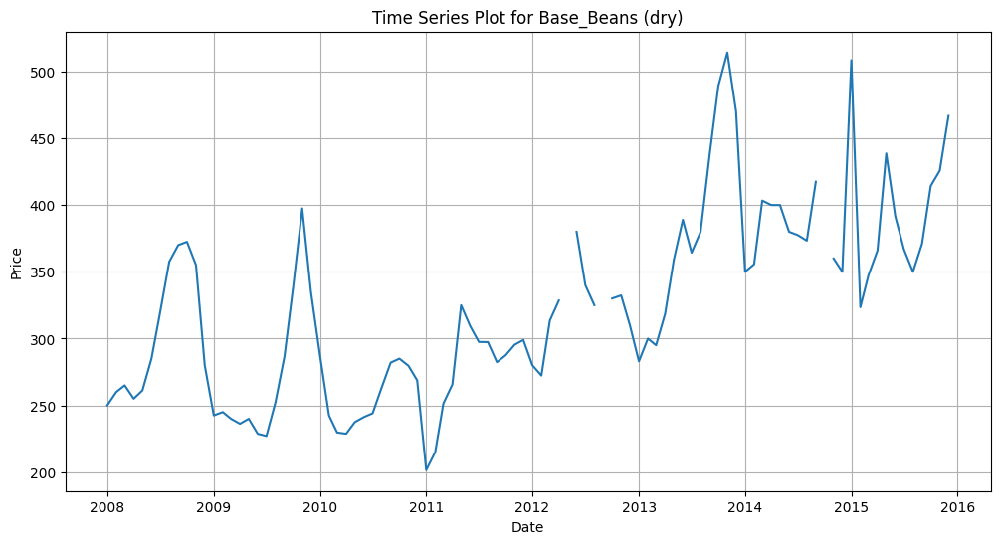

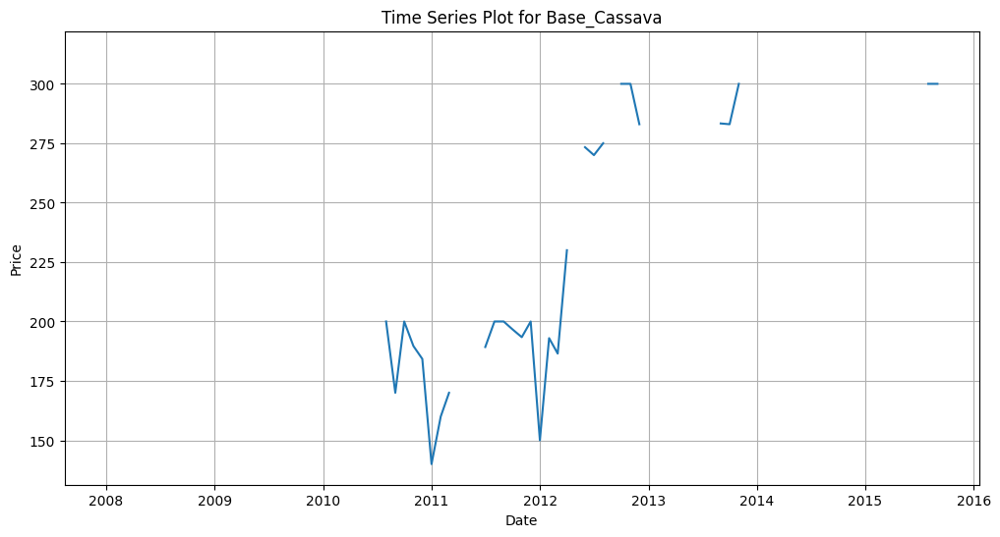

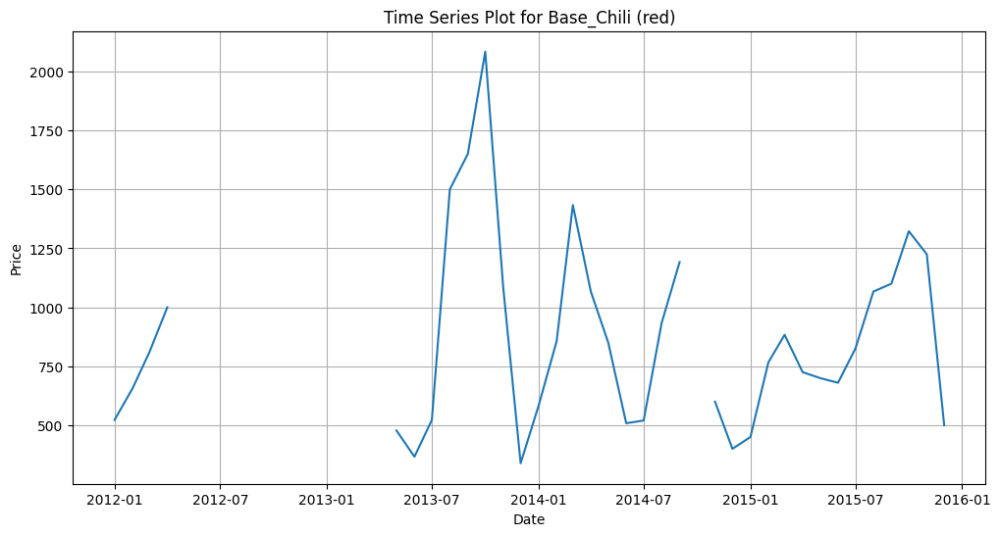

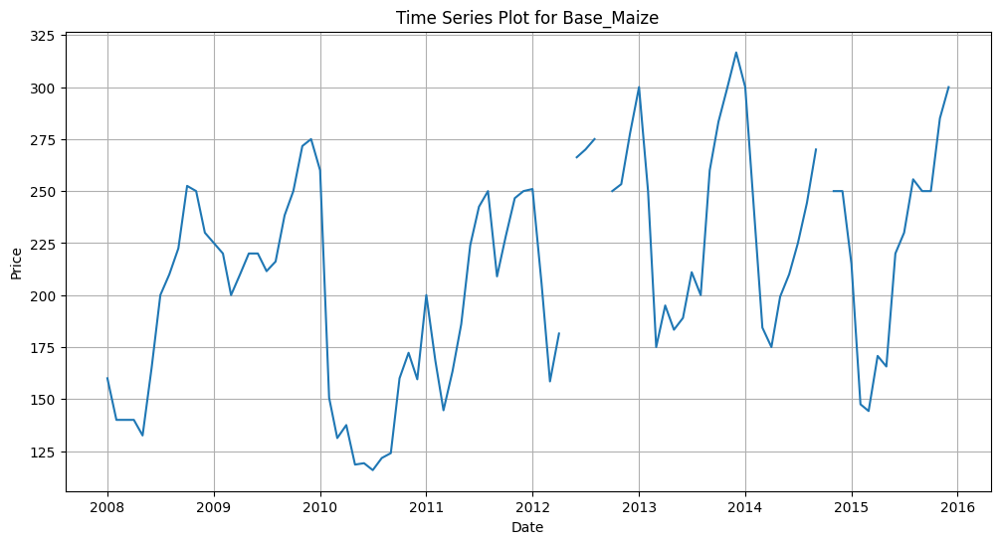

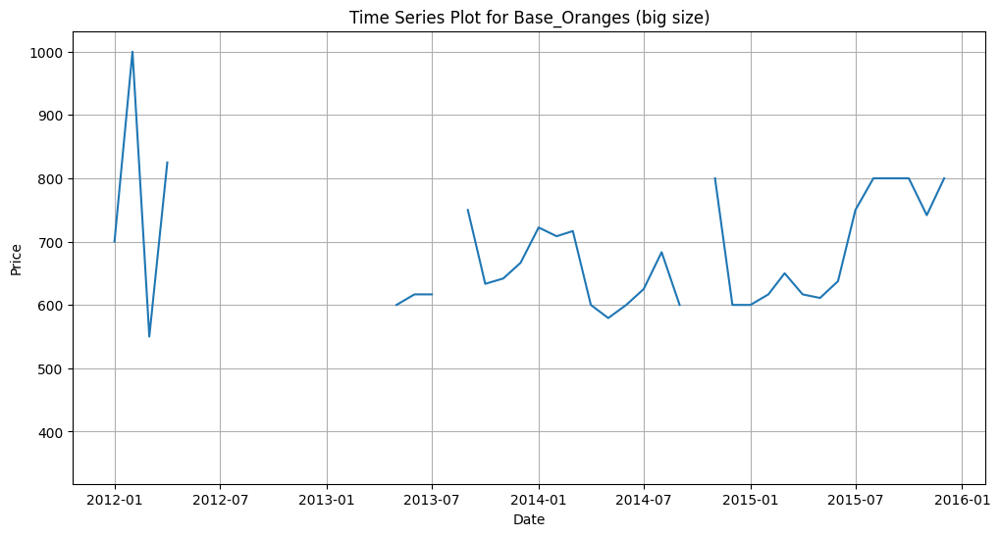

...

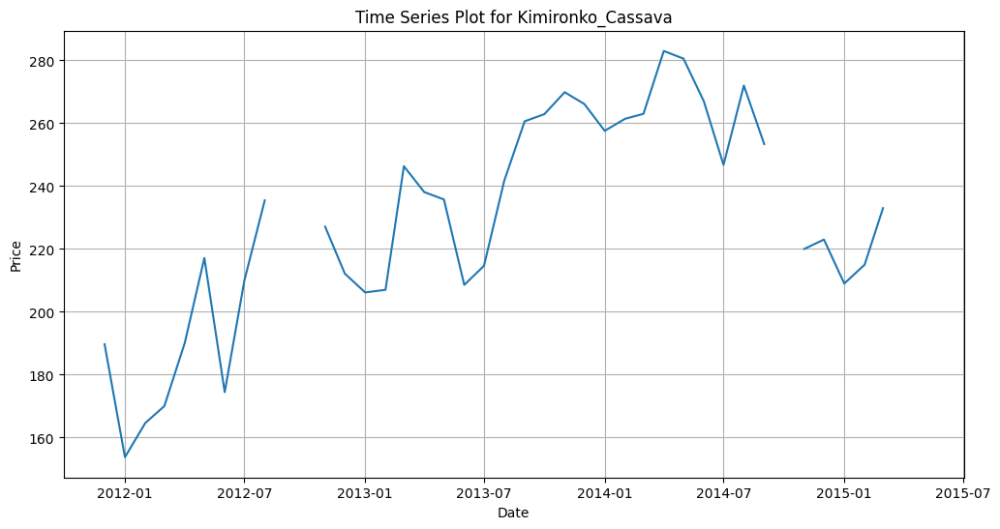

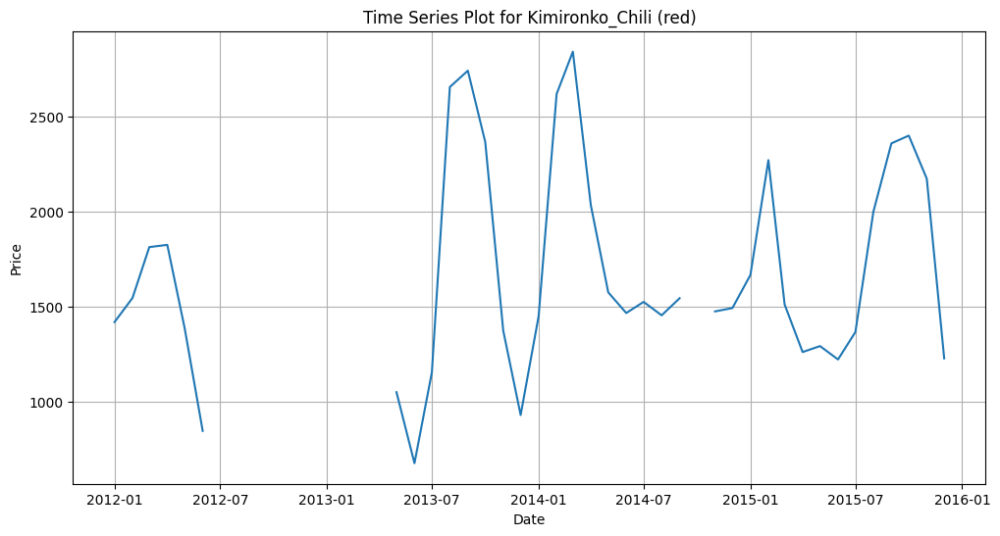

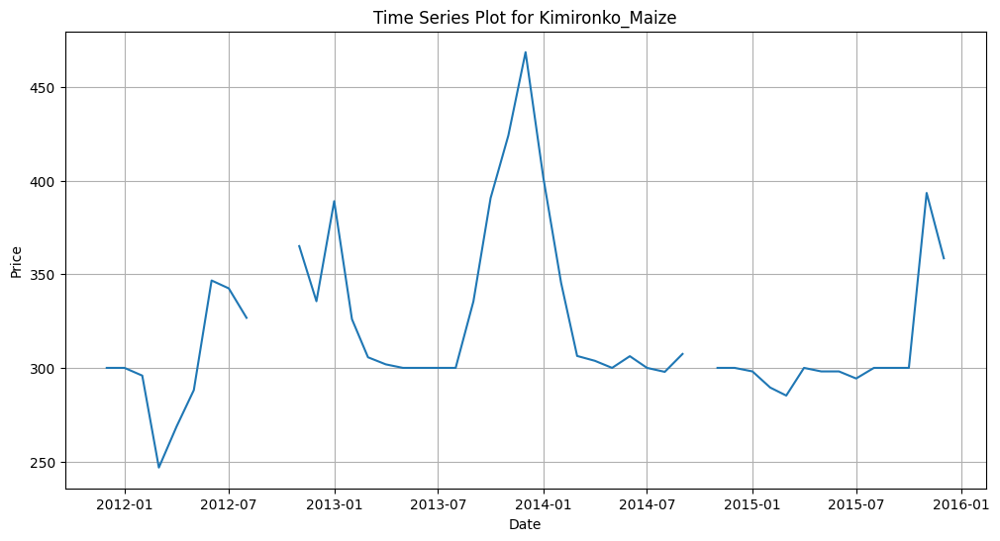

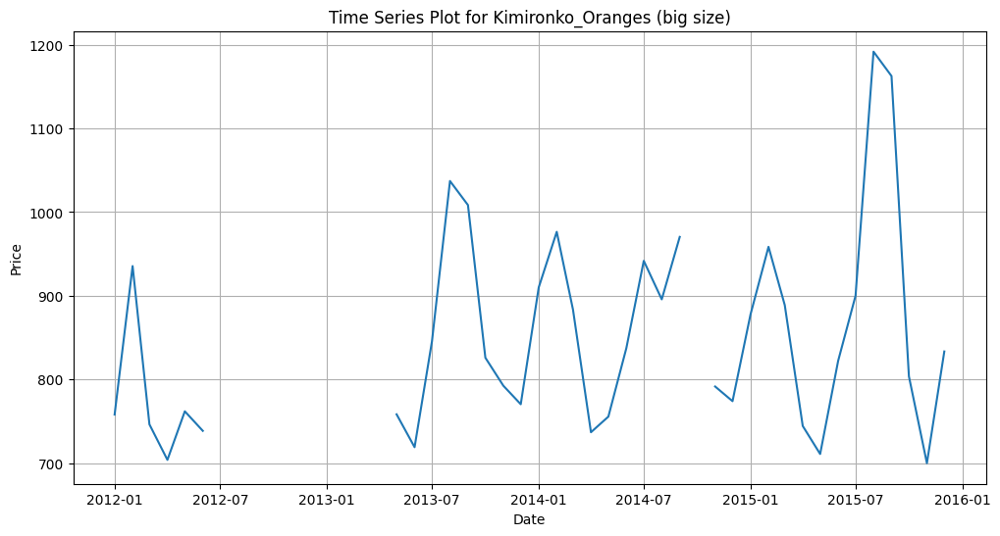

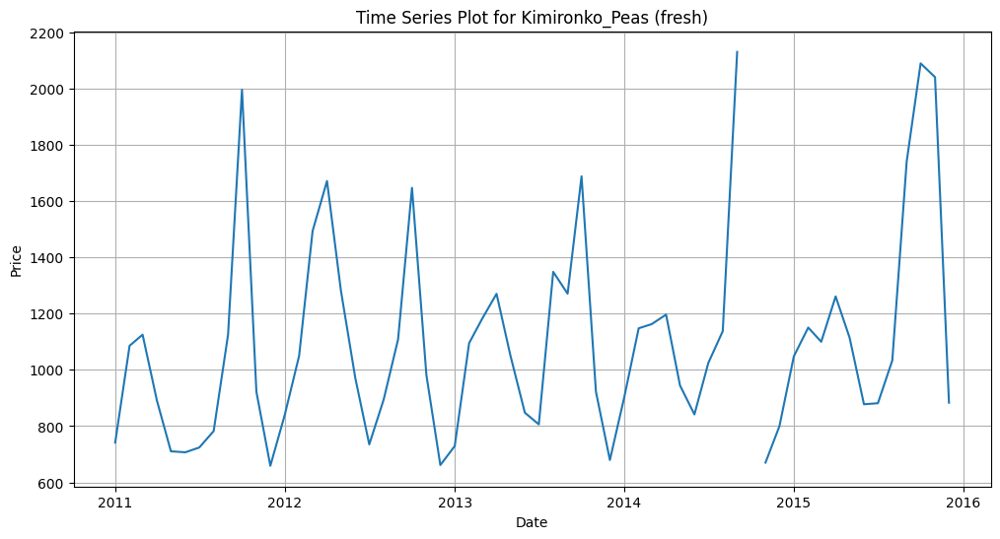

KeyboardInterrupt: 

In [18]:
for col in df011.columns:
    plt.figure(figsize=(12, 6))
    plt.plot(df011.index, df011[col])
    plt.title(f'Time Series Plot for {col}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.grid(True)
    plt.show()

In [ ]:
# prompt: Overlay multiple time series in a single plot to explore relationships
# between goods in a better visualization easy to interpret with legend in a different image in an interactive graph

import matplotlib.pyplot as plt

# Assuming df011 is your DataFrame with 'Date' as index and goods as columns

# Create the plot
plt.figure(figsize=(12, 6))  # Adjust figure size as needed

for col in df011.columns:
    plt.plot(df011.index, df011[col], label=col)

plt.title('Time Series Plot of Multiple Goods')
plt.xlabel('Date')
plt.ylabel('Price')
plt.grid(True)

# Create a separate legend image
plt.figure(figsize=(2, 4))  # Adjust legend figure size as needed
handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(handles, labels, loc='center')
plt.axis('off')  # Hide the axis for the legend image
plt.savefig('legend.png', bbox_inches='tight') # Save legend image

# Show the main plot (with no legend on it)
plt.figure(figsize=(12,6))
for col in df011.columns:
    plt.plot(df011.index, df011[col], label=col)
plt.title('Time Series Plot of Multiple Goods')
plt.xlabel('Date')
plt.ylabel('Price')
plt.grid(True)
plt.show()

# Display the saved legend image
from IPython.display import Image
Image('legend.png')


# Interactive plot using plotly (optional)
# Install plotly if you don't have it
# !pip install plotly

import plotly.graph_objects as go
from plotly.subplots import make_subplots

fig = go.Figure()
for col in df011.columns:
  fig.add_trace(go.Scatter(x=df011.index, y=df011[col], name=col, mode="lines+markers"))

fig.update_layout(title='Interactive Time Series Plot', xaxis_title='Date', yaxis_title='Price')

fig.show()

# Task 3

In [19]:
# Identify columns with missing values and their counts
missing_values = df011.isnull().sum()

# Filter for columns with missing values
missing_columns = missing_values[missing_values > 0]

print("Columns with missing values and their counts:")
missing_columns

Columns with missing values and their counts:


,0
good,
Base_Beans (dry),3
Base_Cassava,58
Base_Chili (red),60
Base_Maize,3
Base_Oranges (big size),61
...,...
Rwamagana_Oranges (big size),76
Rwamagana_Peas (fresh),63
Rwamagana_Potatoes (Irish),51


In [20]:
# Fill missing values using linear interpolation for each column
df011_filled = df011.interpolate(method='linear', limit_direction='both')

Justification: Linear interpolation is generally a good choice for time series data when you have a relatively smooth trend. It assumes a linear relationship between data points and creates new values by estimating them along a straight line.
Setting `limit_direction='both'` ensures that missing values at the beginning and end of the time series are also filled using interpolation, propagating the values from the nearest available data points.
Alternative methods and when to use them:
Forward-fill (ffill):  Suitable when the value is likely to remain the
same as the previous value, such as in cases of sensor data, where measurements might be temporarily unavailable but expected to resume the previous value quickly.
Backward-fill (bfill): Suitable when the value is likely to remain the same as the next value, but this is less common.

# Task 4

In [21]:
# prompt: Calculate the correlation matrix for the goods in the DataFrame df011_filled

correlation_matrix = df011_filled.corr()
correlation_matrix

good,Base_Beans (dry),Base_Cassava,Base_Chili (red),Base_Maize,Base_Oranges (big size),Base_Peas (fresh),Base_Potatoes (Irish),Base_Sorghum,Base_Tomatoes,Birambo_Beans (dry),...,Rwagitima_Tomatoes,Rwamagana_Beans (dry),Rwamagana_Cassava,Rwamagana_Chili (red),Rwamagana_Maize,Rwamagana_Oranges (big size),Rwamagana_Peas (fresh),Rwamagana_Potatoes (Irish),Rwamagana_Sorghum,Rwamagana_Tomatoes
good,,,,,,,,,,,,,,,,,,,,,
Base_Beans (dry),1.000000,0.603979,0.526947,0.520676,-0.147041,0.501138,0.573248,0.464444,0.279425,0.712431,...,0.069939,0.736340,0.683477,0.443449,0.591031,0.476292,0.612773,0.612997,0.458077,0.460053
Base_Cassava,0.603979,1.000000,0.463130,0.483735,-0.344123,0.609044,0.656566,0.459814,0.633188,0.580998,...,0.381985,0.556298,0.734446,0.209366,0.584993,0.409759,0.708071,0.639139,0.544768,0.743669
Base_Chili (red),0.526947,0.463130,1.000000,0.234198,0.034050,0.513317,0.620690,0.206646,0.131721,0.628992,...,0.177348,0.684013,0.469313,0.715218,0.510644,0.528675,0.508924,0.622742,0.275396,0.195999
Base_Maize,0.520676,0.483735,0.234198,1.000000,-0.177424,0.127455,0.227488,0.371680,0.233197,0.339773,...,-0.058760,0.361843,0.435774,0.127459,0.493783,0.100382,0.386782,0.313884,0.231706,0.213943
Base_Oranges (big size),-0.147041,-0.344123,0.034050,-0.177424,1.000000,-0.247503,-0.226373,-0.379160,-0.586240,-0.011714,...,-0.190636,-0.016802,-0.272216,0.022408,-0.334396,-0.010249,-0.417723,-0.243893,-0.395235,-0.466030
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Rwamagana_Oranges (big size),0.476292,0.409759,0.528675,0.100382,-0.010249,0.438165,0.548490,0.375049,0.254768,0.518885,...,0.332689,0.563330,0.516520,0.576801,0.394621,1.000000,0.507161,0.602364,0.432528,0.493913
Rwamagana_Peas (fresh),0.612773,0.708071,0.508924,0.386782,-0.417723,0.709148,0.691671,0.500971,0.607541,0.527354,...,0.371139,0.725063,0.771714,0.377911,0.816673,0.507161,1.000000,0.751369,0.655735,0.720233
Rwamagana_Potatoes (Irish),0.612997,0.639139,0.622742,0.313884,-0.243893,0.656379,0.813347,0.520342,0.561109,0.603901,...,0.322166,0.733151,0.684406,0.437854,0.698315,0.602364,0.751369,1.000000,0.622856,0.616426


In [22]:
# Find the pair of goods with the highest correlation (excluding self-correlation)
correlation_matrix = correlation_matrix.mask(np.equal(*np.indices(correlation_matrix.shape)))
max_value = np.nanmax(correlation_matrix)
row_max, col_max = correlation_matrix[correlation_matrix == max_value].stack().idxmax()

print(f"The pair of goods with the highest correlation is {row_max} and {col_max}, with a correlation of {max_value}")

The pair of goods with the highest correlation is Gahanga_Tomatoes and Rwamagana_Tomatoes, with a correlation of 0.986690687170234


In [ ]:


plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix Heatmap')
plt.show()

In [ ]:
# prompt: Justify why correlation is a meaningful metric for this comparison.

Correlation is a meaningful metric for comparing the price movements of different goods because it quantifies the linear relationship between their prices over time.  A high positive correlation indicates that the prices of two goods tend to move in the same direction—when the price of one increases, the price of the other tends to increase as well, and vice-versa. A high negative correlation suggests an inverse relationship—when the price of one increases, the price of the other tends to decrease.  A correlation near zero implies little to no linear relationship between the price movements.

In the context of your analysis, examining the correlation between different agricultural commodity prices helps to understand how they influence one another in the market.  This information can be valuable for:

* **Portfolio Management:**  Investors could use this information to diversify their investments in related commodities.
* **Market Prediction:**  Understanding the relationships between prices could lead to more accurate price forecasts.
* **Supply Chain Optimization:** Businesses operating in these markets can anticipate price fluctuations and optimize their purchasing and production strategies.
* **Economic Analysis:** Observing price correlations can give insights into the underlying economic factors that affect multiple commodities.


Correlation, while useful, does have limitations. It only captures *linear* relationships.  Two goods might have a complex, non-linear relationship that a correlation coefficient wouldn't fully reveal.  Additionally, correlation does not imply causation. Even if two goods are highly correlated, it doesn't necessarily mean that the price of one *causes* the price of the other to change.  Other factors might be influencing both.


# Task 5

## 1. Moving Average

In [24]:
# prompt: Implement moving average on df011 where column is Gahanga_Tomatoes for 2 different window sizes (3 months and 6 months)

# Calculate 3-month moving average
df011['Gahanga_Tomatoes_MA_3M'] = df011['Gahanga_Tomatoes'].rolling(window=3).mean()

# Calculate 6-month moving average
df011['Gahanga_Tomatoes_MA_6M'] = df011['Gahanga_Tomatoes'].rolling(window=6).mean()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


            Predicted_Price
Date                       
2015-12-31       501.159911
2016-01-30       499.455940
2016-02-29       504.333491
2016-03-30       477.117308
2016-04-29       477.862023
2016-05-29       448.298820


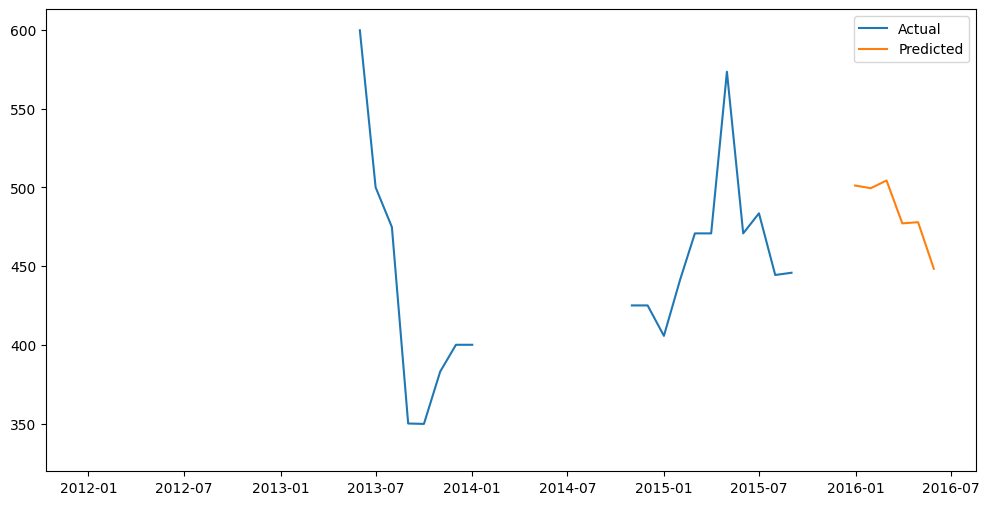

In [29]:
# Select the 'Gahanga_Tomatoes' column for prediction
data_to_predict = df011['Gahanga_Tomatoes']

# Fit an ARIMA model (example: order=(5,1,0))
model = ARIMA(data_to_predict, order=(5, 1, 0)) # Adjust the order as needed
model_fit = model.fit()

# Predict the next 6 months
last_date = data_to_predict.index[-1]
future_dates = [last_date + timedelta(days=30*i) for i in range(1, 7)] #add 6 months
predictions = model_fit.predict(start=len(data_to_predict), end=len(data_to_predict)+5)

# Create a DataFrame for the predictions
predictions_df = pd.DataFrame({'Date': future_dates, 'Predicted_Price': predictions})
predictions_df = predictions_df.set_index('Date')

# Print or visualize the predictions
print(predictions_df)

#Plot predictions
plt.figure(figsize=(12, 6))
plt.plot(data_to_predict.index, data_to_predict, label='Actual')
plt.plot(predictions_df.index, predictions_df['Predicted_Price'], label='Predicted')
plt.legend()
plt.show()

## 2. Exponential smoothing

In [ ]:
# Simple Exponential Smoothing (SES)
ses_model = SimpleExpSmoothing(data_to_predict)
ses_fit = ses_model.fit(smoothing_level=0.2) # Adjust smoothing_level as needed
df011['Gahanga_Tomatoes_SES'] = ses_fit.fittedvalues

# Holt's Linear Trend Method
holt_model = ExponentialSmoothing(data_to_predict, trend="add") # Or "mul" for multiplicative trend
holt_fit = holt_model.fit(smoothing_level=0.2, smoothing_slope=0.1) # Adjust parameters as needed
df011['Gahanga_Tomatoes_Holt'] = holt_fit.fittedvalues

# Holt-Winters' Seasonal Method (if seasonality is present)
# hw_model = ExponentialSmoothing(data_to_predict, trend="add", seasonal="add", seasonal_periods=12) # 12 for yearly seasonality, adjust as needed
# hw_fit = hw_model.fit(smoothing_level=0.2, smoothing_slope=0.1, smoothing_seasonal=0.1)
# df011['Gahanga_Tomatoes_HW'] = hw_fit.fittedvalues

# Plotting to compare
plt.figure(figsize=(12, 6))
plt.plot(data_to_predict, label='Actual')
plt.plot(df011['Gahanga_Tomatoes_SES'], label='SES')
plt.plot(df011['Gahanga_Tomatoes_Holt'], label='Holt')
#plt.plot(df011['Gahanga_Tomatoes_HW'], label='Holt-Winters')  # uncomment if you use HW
plt.legend()
plt.show()

In [32]:

predictions_df

,Predicted_Price
Date,
2015-12-31,501.159911
2016-01-30,499.455940
2016-02-29,504.333491
2016-03-30,477.117308
2016-04-29,477.862023
2016-05-29,448.298820


## 3. Facebook Prophet

In [34]:
# Assuming df011_filled is your DataFrame with the filled data

# Prepare the data for Prophet
prophet_df = df011_filled[['Gahanga_Tomatoes']].reset_index()
prophet_df.columns = ['ds', 'y']  # Rename columns to 'ds' and 'y'
prophet_df.head()

,ds,y
0,2008-01-01,333.0
1,2008-02-01,333.0
2,2008-03-01,333.0
3,2008-04-01,333.0
4,2008-05-01,333.0


In [35]:
# prompt:  Fit a Prophet model and forecast the next 6 months.

# Initialize and fit the Prophet model
model = Prophet()
model.fit(prophet_df)

# Create future dataframe for 6 months
future = model.make_future_dataframe(periods=6, freq='MS')

# Make predictions
forecast = model.predict(future)

# Print the forecast
print(forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(6))

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpa36783y4/vd2nw_7b.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpa36783y4/nnv7ergq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=33777', 'data', 'file=/tmp/tmpa36783y4/vd2nw_7b.json', 'init=/tmp/tmpa36783y4/nnv7ergq.json', 'output', 'file=/tmp/tmpa36783y4/prophet_model1gk2odnu/prophet_model-20241129040525.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
04:05:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:05:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


            ds        yhat  yhat_lower  yhat_upper
96  2016-01-01  471.234963  407.876718  530.638139
97  2016-02-01  481.103982  420.174644  547.833835
98  2016-03-01  486.801722  421.912413  551.637615
99  2016-04-01  502.187426  441.782333  564.183667
100 2016-05-01  500.630569  438.166800  560.592151
101 2016-06-01  516.049205  451.302526  578.496743


## Visualization of all three models

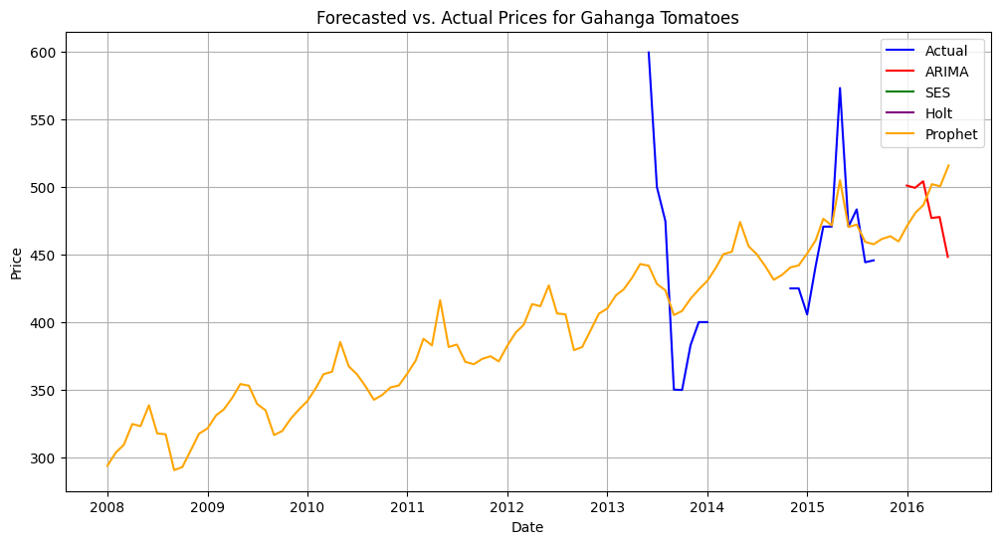

In [36]:
# prompt:  Visualize the forecasted results for all three methods alongside the actual
# time series.

# Create a figure and axes for the plot
fig, ax = plt.subplots(figsize=(12, 6))

# Plot the actual time series
ax.plot(df011.index, df011['Gahanga_Tomatoes'], label='Actual', color='blue')

# Plot the ARIMA predictions
ax.plot(predictions_df.index, predictions_df['Predicted_Price'], label='ARIMA', color='red')

# Plot the exponential smoothing predictions
ax.plot(df011.index, df011['Gahanga_Tomatoes_SES'], label='SES', color='green')
ax.plot(df011.index, df011['Gahanga_Tomatoes_Holt'], label='Holt', color='purple')


# Plot the Prophet predictions
ax.plot(forecast['ds'], forecast['yhat'], label='Prophet', color='orange')


# Customize the plot
ax.set_xlabel('Date')
ax.set_ylabel('Price')
ax.set_title('Forecasted vs. Actual Prices for Gahanga Tomatoes')
ax.legend()
ax.grid(True)

# Show the plot
plt.show()